In [7]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

In [8]:
df = pd.read_csv("data.csv", sep= ";")
pnl = df.loc[:,["timestamp"]]
products = df['product'].unique()
dfs = {}
for product in products:
    dfs[product] = df.loc[df['product'] == product].copy().reset_index(drop = True)

In [9]:
def plot_product_prices_volumes(dfs, product_name):
    df = dfs[product_name]

    # Plot settings
    plot_titles = [
        'Mid Price Over Time',
        'Ask Prices 1, 2, and 3 Over Time',
        'Bid Prices 1, 2, and 3 Over Time',
        'Mid, Ask, and Bid Prices 1, 2, and 3 Over Time',
        'Bid Volumes 1, 2, and 3 Over Time',
        'Ask Volumes 1, 2, and 3 Over Time'
    ]
    y_axes = [
        'mid_price',
        ['ask_price_1', 'ask_price_2', 'ask_price_3'],
        ['bid_price_1', 'bid_price_2', 'bid_price_3'],
        ['mid_price', 'ask_price_1', 'ask_price_2', 'ask_price_3', 'bid_price_1', 'bid_price_2', 'bid_price_3'],
        ['bid_volume_1', 'bid_volume_2', 'bid_volume_3'],
        ['ask_volume_1', 'ask_volume_2', 'ask_volume_3']
    ]

    ask_colors = ['#FFA07A', '#FA8072', '#8B0000']
    bid_colors = ['#90EE90', '#008000', '#556B2F']
    mid_color = '#0000FF'
    volume_colors = {
        'ask_volume': ['#FFDAB9', '#F0E68C', '#DEB887'],
        'bid_volume': ['#98FB98', '#32CD32', '#228B22']
    }

    for i, title in enumerate(plot_titles):
        fig = go.Figure()

        if isinstance(y_axes[i], str):  # For single column data (Mid Price)
            hover_text = df.apply(lambda x: f'Time: {x["timestamp"]}<br>Mid: {x["mid_price"]}', axis=1)
            fig.add_trace(go.Scatter(
                x=df['timestamp'], y=df[y_axes[i]], mode='lines+markers', name=y_axes[i],
                hoverinfo='text', text=hover_text, line=dict(color=mid_color)
            ))
        else:  # For multiple columns data (Bid/Ask Prices and Volumes)
            for idx, col in enumerate(y_axes[i]):
                if 'ask_price' in col or 'bid_price' in col:
                    level = col.split('_')[-1]
                    volume_col = col.replace('price', 'volume')
                    hover_text = df.apply(lambda x: f'Time: {x["timestamp"]}<br>{col}: {x[col]}<br>Volume: {x[volume_col]}<br>Mid: {x["mid_price"]}', axis=1)
                    color = ask_colors[int(level) - 1] if 'ask_price' in col else bid_colors[int(level) - 1]
                elif col == 'mid_price':
                    hover_text = df.apply(lambda x: f'Time: {x["timestamp"]}<br>Mid: {x["mid_price"]}', axis=1)
                    color = mid_color
                else:
                    hover_text = df.apply(lambda x: f'Time: {x["timestamp"]}<br>{col}: {x[col]}', axis=1)
                    color = volume_colors['ask_volume'][int(level) - 1] if 'ask_volume' in col else volume_colors['bid_volume'][int(level) - 1]

                fig.add_trace(go.Scatter(
                    x=df['timestamp'], y=df[col], mode='lines+markers', name=col,
                    hoverinfo='text', text=hover_text, line=dict(color=color)
                ))

        fig.update_layout(title=title, xaxis_title="Timestamp", yaxis_title="Value", width=1024, height=400)
        fig.show()


In [10]:
for product in products:
    print(product)
    plot_product_prices_volumes(dfs, product)

AMETHYSTS


STARFRUIT


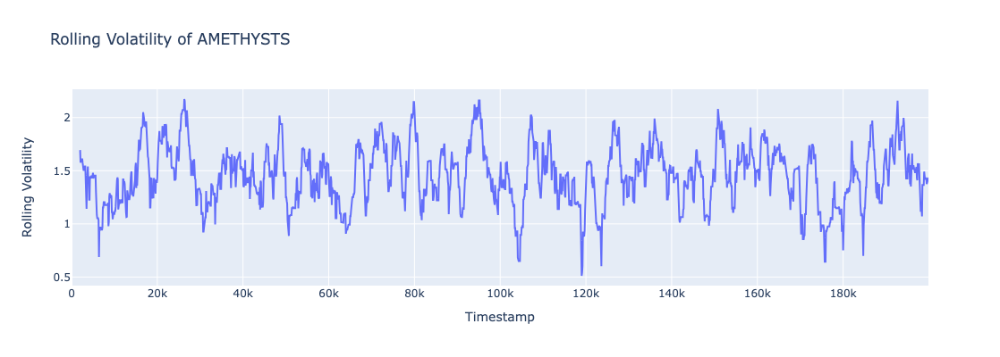

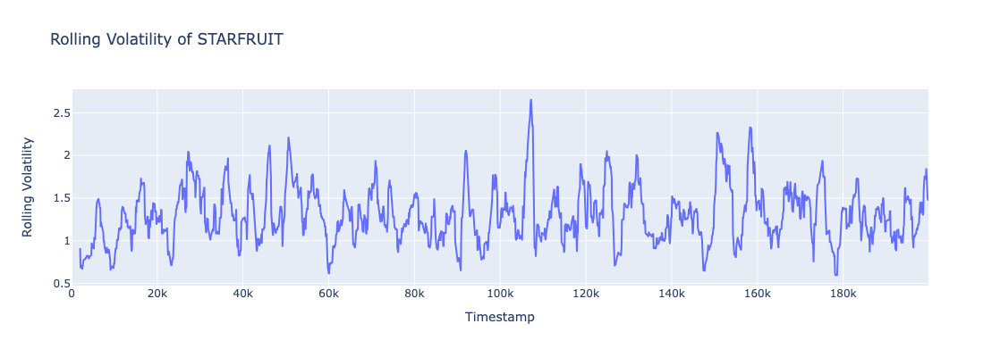

In [44]:
def plot_rolling_volatility(product_df, product_name, window_size=21):
    product_df = product_df[product_name].copy()
    # Calculate the log returns of the mid prices
    # product_df['log_return'] = np.log(product_df['mid_price'] / product_df['mid_price'].shift(1)).dropna()
    
    # Calculate the rolling standard deviation of the log returns
    product_df['rolling_vol'] = product_df['mid_price'].rolling(window=window_size).std()
    
    # Plot the rolling volatility
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['rolling_vol'],
                             mode='lines', name=f'Rolling Volatility ({window_size} periods)'))
    
    # Update the layout
    fig.update_layout(title=f'Rolling Volatility of {product_name}',
                      xaxis_title='Timestamp',
                      yaxis_title='Rolling Volatility',
                      width=1024, height=400)
    fig.show()


# Loop through each product to calculate and plot its rolling volatility
for product in products:
    plot_rolling_volatility(dfs, product)

In [50]:
def plot_price_with_std_bands(product_df, window_size=210):
    # Calculate rolling standard deviation of the mid_price
    product_df['rolling_std'] = product_df['mid_price'].rolling(window=window_size).std()

    # Calculate mid_price bands, shifted by one time step
    product_df['mid_plus_1std'] = (product_df['mid_price'] + product_df['rolling_std']).shift(1)
    product_df['mid_minus_1std'] = (product_df['mid_price'] - product_df['rolling_std']).shift(1)
    product_df['mid_plus_1_5std'] = (product_df['mid_price'] + 1.5 * product_df['rolling_std']).shift(1)
    product_df['mid_minus_1_5std'] = (product_df['mid_price'] - 1.5 * product_df['rolling_std']).shift(1)
    product_df['mid_plus_2std'] = (product_df['mid_price'] + 2 * product_df['rolling_std']).shift(1)
    product_df['mid_minus_2std'] = (product_df['mid_price'] - 2 * product_df['rolling_std']).shift(1)
    
    # Plot mid_price and the bands
    fig = go.Figure()

    # Upper and lower bands for 2 standard deviations
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_plus_2std'],
                             mode='lines', name='Mid Price + 2 STD', line=dict(width=0),
                             fill=None, line_color='rgba(255,0,0,0.5)'))
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_minus_2std'],
                             mode='lines', name='Mid Price - 2 STD', line=dict(width=0),
                             fill='tonexty', fillcolor='rgba(255,0,0,0.2)', line_color='rgba(255,0,0,0.5)'))

    # Upper and lower bands for 1.5 standard deviations
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_plus_1_5std'],
                             mode='lines', name='Mid Price + 1.5 STD', line=dict(width=0),
                             fill=None, line_color='rgba(255,165,0,0.5)'))
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_minus_1_5std'],
                             mode='lines', name='Mid Price - 1.5 STD', line=dict(width=0),
                             fill='tonexty', fillcolor='rgba(255,165,0,0.2)', line_color='rgba(255,165,0,0.5)'))

    # Upper and lower bands for 1 standard deviation
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_plus_1std'],
                             mode='lines', name='Mid Price + 1 STD', line=dict(width=0),
                             fill=None, line_color='rgba(0,128,0,0.5)'))
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_minus_1std'],
                             mode='lines', name='Mid Price - 1 STD', line=dict(width=0),
                             fill='tonexty', fillcolor='rgba(0,128,0,0.2)', line_color='rgba(0,128,0,0.5)'))
    
    # Mid price line
    fig.add_trace(go.Scatter(x=product_df['timestamp'], y=product_df['mid_price'],
                             mode='lines', name='Mid Price', line=dict(color='blue')))
    
    # Update the layout
    fig.update_layout(title='Mid Price and Rolling Standard Deviation Bands',
                      xaxis_title='Timestamp',
                      yaxis_title='Price',
                      width=1024, height=600)
    fig.show()

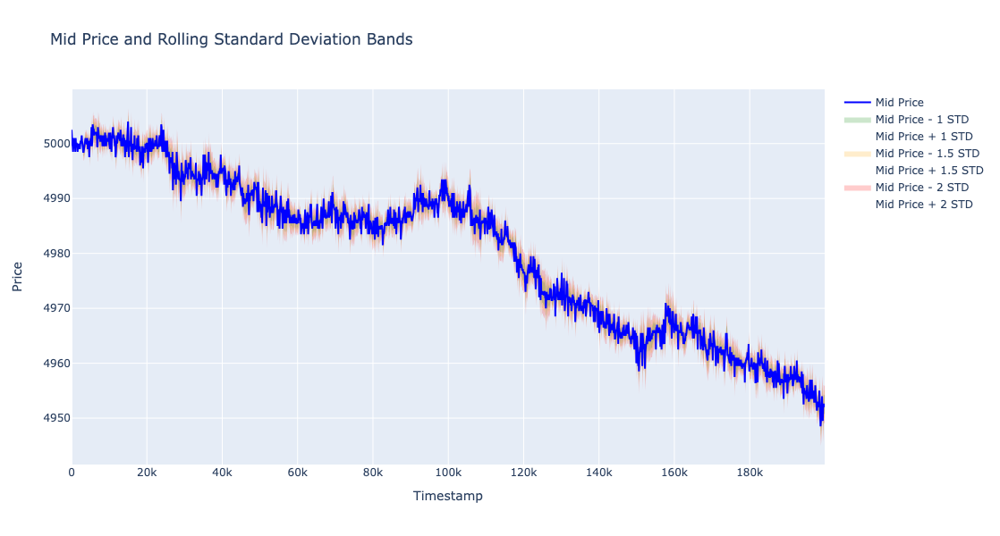

In [55]:
plot_price_with_std_bands(dfs['STARFRUIT'], window_size= 30)

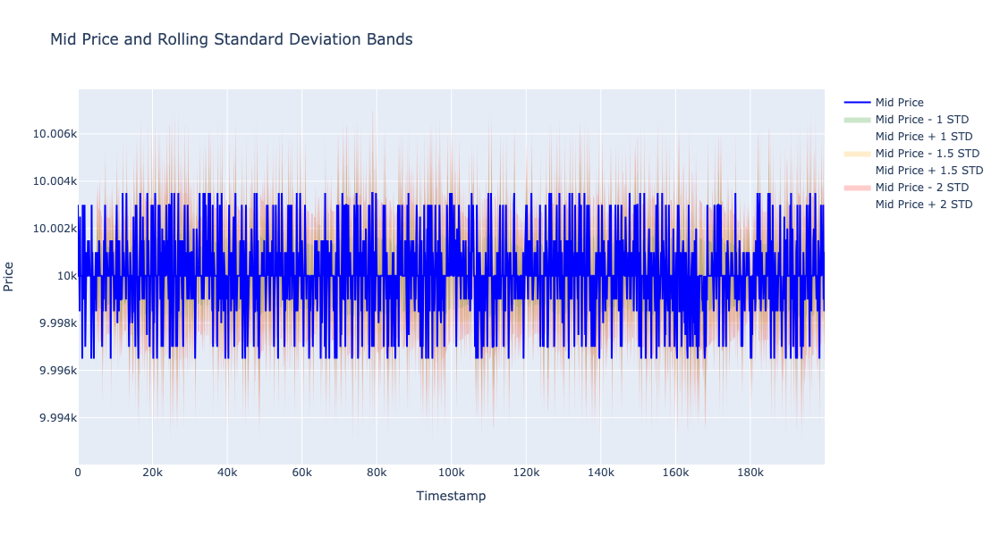

In [56]:
plot_price_with_std_bands(dfs['AMETHYSTS'], window_size= 50)

In [78]:
buy_orders={}

In [79]:
len(buy_orders)

0

In [83]:
dfs['AMETHYSTS'][['timestamp'] = 9700]

SyntaxError: invalid syntax (2042726153.py, line 1)

In [84]:
df.loc[df,:]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss
0,-2,0,AMETHYSTS,10002,1,9996.0,2.0,9995.0,29.0,10004,2,10005.0,29.0,NaN,NaN,10003.0,0.0
1,-2,0,STARFRUIT,5002,1,4997.0,31.0,NaN,NaN,5003,31,NaN,NaN,NaN,NaN,5002.5,0.0
2,-2,100,AMETHYSTS,9996,2,9995.0,22.0,NaN,NaN,10004,2,10005.0,22.0,NaN,NaN,10000.0,4.0
3,-2,100,STARFRUIT,4997,24,NaN,NaN,NaN,NaN,5003,2,5004.0,22.0,NaN,NaN,5000.0,0.0
4,-2,200,STARFRUIT,4997,2,4996.0,20.0,NaN,NaN,5003,20,NaN,NaN,NaN,NaN,5000.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,-2,199700,AMETHYSTS,9998,8,9996.0,2.0,9995.0,25.0,10004,2,10005.0,25.0,NaN,NaN,10001.0,1264.0
3996,-2,199800,STARFRUIT,4949,21,NaN,NaN,NaN,NaN,4956,21,NaN,NaN,NaN,NaN,4952.5,0.0
3997,-2,199800,AMETHYSTS,9995,21,NaN,NaN,NaN,NaN,10002,8,10005.0,21.0,NaN,NaN,9998.5,1264.0
3998,-2,199900,STARFRUIT,4950,32,NaN,NaN,NaN,NaN,4954,7,4956.0,32.0,NaN,NaN,4952.0,0.0


In [92]:
df['timestamp'] == 9700

0       False
1       False
2       False
3       False
4       False
        ...  
3995    False
3996    False
3997    False
3998    False
3999    False
Name: timestamp, Length: 4000, dtype: bool

In [94]:
df[df['timestamp'] == 9700]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss
194,-2,9700,AMETHYSTS,9995,22,NaN,NaN,NaN,NaN,10002,1,10005.0,22.0,NaN,NaN,9998.5,26.0
195,-2,9700,STARFRUIT,4997,22,NaN,NaN,NaN,NaN,5004,22,NaN,NaN,NaN,NaN,5000.5,0.0


In [110]:
sell_orders={11: -4, 12: -8, 9:-12}

In [112]:
from collections import OrderedDict
for key, value in OrderedDict(sorted(sell_orders.items())).items():
    print(key, value)

9 -12
11 -4
12 -8
